In [1]:
!pip install nbconvert

You should consider upgrading via the 'c:\python_projects\la_piscine\exam_la_piscine\venv\scripts\python.exe -m pip install --upgrade pip' command.


In [1]:
import pandas as pd  # handling data
import numpy as np
from pathlib import Path  # i/o and search in folders
from os import chdir
import shutil
import sidetable as stb
import missingno as msno  # data visualisation
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import cufflinks as cf
import pingouin as pg  # statistics
from scipy import stats

# from sklearn.preprocessing import FunctionTransformer
# from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import RobustScaler

import warnings

warnings.filterwarnings("ignore")

# # if using a Jupyter notebook, include:
# %matplotlib inline
# %config InlineBackend.figure_formats = ["pdf", "png"]
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"


In [3]:
import pandas as pd  # handling data
import numpy as np
from pathlib import Path  # i/o and search in folders
from os import chdir
import shutil
import sidetable as stb
import missingno as msno  # data visualisation
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import cufflinks as cf
import pingouin as pg  # statistics
from scipy import stats

# from sklearn.preprocessing import FunctionTransformer
# from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import RobustScaler

import warnings

warnings.filterwarnings("ignore")

# # if using a Jupyter notebook, include:
# %matplotlib inline
# %config InlineBackend.figure_formats = ["pdf", "png"]
from IPython.core.interactiveshell import InteractiveShell

InteractiveShell.ast_node_interactivity = "all"


In [4]:
# default folder to load files for analysis
file_path_source = "C:/python_projects/exam_piscine/sources/"
# default folder to save generated files
file_path_save = "C:/python_projects/exam_piscine/files/"
# default folder to backup generated files
file_path_backup = "C:/python_projects/exam_piscine/backup/"
# default folder to save generated figures
file_path_figure = "C:/python_projects//exam_piscine/figures/"


In [5]:
# still a work in progress
def default_folders():
    """Prepare the default folders."""
    # home directory
    file_working_dir = Path.home()
    print(f"The home directory is: \n{file_working_dir}\n")
    # current directory
    current_dir = Path.cwd()
    print(f"The current directory is: \n{current_dir}\n")
    # change path to upper level with ".." (as in "cd..")
    path = Path("..")
    chdir(path)
    print(f"The new working directory is: \n{path.cwd()}\n")

    print(f"The working directory is: \n{current_dir}\n")
    # default folder to open .py files and source files for analysis
    file_path_source = Path.cwd() / "sources"
    print(
        f"The source files (.py files and .csv source files) are located in: "
        f"\n{file_path_source}\n"
    )
    # default folder to save generated files
    file_path_save = Path.cwd() / "files"
    print(f"Files are saved in the 'files' folder: \n{file_path_save}\n")
    # default folder to backup generated files
    file_path_backup = Path.cwd() / "backup"
    print(f"The backed files are stored in: \n{file_path_backup}\n")
    # default folder to save generated figures
    file_path_figure = Path.cwd() / "figures"
    print(f"Figure files are saved in: \n{file_path_figure}\n")


# NOT working for now
# default_folders()



In [6]:
def start_config():
    """Initialise the configuration for pandas features display mode.

    The display is set to:
        - print all columns (0 maximum columns) in the terminal
        - the maximum width of columns is set to 1000 pixels
        - a maximum of 200 rows will be displayed in the terminal
        - the default precision of floats will be 3 decimal points

    Also, how to insert the default file paths ?
    """
    options = {
        "display": {
            "max_columns": None,  # Max number of columns
            "max_colwidth": None,  # Max width of columns
            "max_seq_item": None,  # display all items in list
            # "max_rows": None,  # Max number of rows
            # "min_rows": 20,  # 20 rows minimum
            "precision": 3,  # Float number precision (3 decimal places)
            "encoding": "UTF-8",
            # "context": "notebook",
            # "style=": "paper",
        },
    }
    for display, option_vals in options.items():
        for setting, user_val in option_vals.items():
            pd.set_option(f"{display}.{setting}", user_val)
            # sns.set(f"{display}={setting}", user_val)
            sns.set(
                context="notebook",  # or paper
                style="whitegrid",
                palette="colorblind",
                color_codes=True,
            )
            # sns.color_palette("muted", 6)  # or 12 ?
            sns.despine()
            # plt.figure(figsize=(12, 10)
    print(display, setting)
    return options


start_config()



display encoding


{'display': {'max_columns': None,
  'max_colwidth': None,
  'max_seq_item': None,
  'precision': 3,
  'encoding': 'UTF-8'}}

<Figure size 432x288 with 0 Axes>

In [7]:
def load_data(file_name, index=None):
    """Load the AGGREGATED file from the monthly measurements.

    In the previous module, "Sampling_Date" was chosen as index because the
        cleaning steps were driven by months of sampling during which dates are
        missing as well as some ring replicates.
    Here, the index was changed to "SampleTrackerNumber" as it is easier to
        look up for the samples with odd (i.e. ouliers) values.

    Analysis of "ghg_flux_data" for now. Hence, the "ghg_mdf" data are droped.

    Args:
        file_name (.pkl): pickled file generated at the end of the
            "dep_vars_formatting.py" module.
            Thanks to properties of pickle files, the data types
            (category, numerical, etc.) were preserved.
            The file should be situated in the "Source" folder.
        index (string): setting dataframe new index. Possibility to use
            a MultiIndex as in 'index = ["Sampling_Date", "SampleTrackerNo"]'.
            Defaults to None.

    Returns:
        object: dataframe. Afer loading the data file, the ghg flux mdf
            variables were removed from analysis, for now.
    """
    dataframe = pd.read_pickle(file_path_source + file_name)

    dataframe = (
        dataframe.drop(["ch4_mdf", "co2_mdf", "n2o_mdf"], axis=1)
        .reset_index()
        .set_index(index)
    )
    print(
        f"\nDataset preview: \n"
        f"\n{dataframe.info()}\n"
        f"\nDataset summary : \n{dataframe.dtypes}\n"
    )
    return dataframe


ghg_flux_data_clean = load_data(
    "ghg_flux_data_cleaned.pkl", index="SampleTrackerNo"
)



<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 1596 entries, 4125 to 16098
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype                           
---  ------            --------------  -----                           
 0   Sampling_Date     1596 non-null   object                          
 1   Year              1596 non-null   category                        
 2   Month             1596 non-null   category                        
 3   Season            1596 non-null   category                        
 4   Operator          1540 non-null   category                        
 5   co2_treatment     1596 non-null   category                        
 6   Ring              1596 non-null   category                        
 7   Block             1596 non-null   category                        
 8   Collar_Unique_ID  1596 non-null   category                        
 9   ch4_flux          1536 non-null   float64                         
 10  co2_flux      

In [8]:
def define_data_type(dataframe):
    """Define the different types of variables (e.g. categorical, numerical).

    Need to enter manually the column ranges to set data types.
    Ideally, the user should be able to choose (see alternative function next).

    Args:
        dataframe (object): dataframe with a range of data types to be assigned
            to the different columns

    Returns:
        tuple: 4 Pandas dataframes: 1) categorical variables;
            2) date-time variables;    3) dependent variables;
            4) dependent variables but declared individually
            The multiple (dataframe) output represents a tuple which
            is "unpacked" to declare the functions.
    """
    cat_vars = dataframe.iloc[:, :9]
    # set the previous index ("Sampling_Date") back to a "datetime" type
    dataframe["Sampling_Date"] = pd.to_datetime(dataframe["Sampling_Date"])
    datetime_vars = dataframe.loc[:, ["Sampling_Date_tz"]]
    dep_vars = dataframe.iloc[:, 9:12]

    return (
        cat_vars,
        datetime_vars,
        dep_vars,
    )


# cat_vars_clean, datetime_vars_clean, dep_vars_clean = define_data_type(
#     ghg_flux_data_clean
# )
# print(f"\nCheck variable types: \n{ghg_flux_data_clean.dtypes}\n")



In [9]:
def define_data_type_manually(
    dataframe, lower_bound, upper_bound, var_definition, var_type
):
    """Define the different types of variables (e.g. categorical, numerical).

    The variables are chosen "manually" by entering the boundary values for
    selection of columns.
    This is an alternative to data typing for a more 'pythonesque' approach.
    The idea is to define a data type and use '.iloc' properties to quickly
        assign the variable range to declare them on the global scope.

    The user can select manually the range of variables and their names.
    Args:
        dataframe (object): dataframe with a range of data types to be assigned
            to the different columns. All rows by default (:).
        lower_bound (int): starting column index included in the subset
            variables. The bound is inclusive.
        upper_bound (int): ending column index in subset. Bound is exclusive.
        var_type (string): data type, as in category, integer, float, ect.

    Returns:
        object: dataframes that will each contain a data type (category,
            dependent variables, etc.)
    """
    variable_selection = (
        dataframe.iloc[:, lower_bound:upper_bound]
        .convert_dtypes(convert_integer=True)
        .astype(var_type)
    )
    print(f"\n{var_definition.capitalize()} variables selected: \n")
    print(f"\n{variable_selection.info()}\n")
    print(
        f"\n{var_definition.capitalize()} variables data summary: \n"
        f"\n{variable_selection.describe()}\n"
    )
    return variable_selection


cat_vars_clean = define_data_type_manually(
    ghg_flux_data_clean,
    lower_bound=0,
    upper_bound=9,
    var_definition="categorical",
    var_type="category",
)
dep_vars_clean = define_data_type_manually(
    ghg_flux_data_clean,
    lower_bound=9,
    upper_bound=12,
    var_definition="dependent",
    var_type="float",
)
datetime_vars_clean = ghg_flux_data_clean.loc[:, ["Sampling_Date_tz"]]
print(f"\nDatetime variable preview: \n{datetime_vars_clean.sample(10)}\n")




Categorical variables selected: 

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 1596 entries, 4125 to 16098
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Sampling_Date     1596 non-null   category
 1   Year              1596 non-null   category
 2   Month             1596 non-null   category
 3   Season            1596 non-null   category
 4   Operator          1540 non-null   category
 5   co2_treatment     1596 non-null   category
 6   Ring              1596 non-null   category
 7   Block             1596 non-null   category
 8   Collar_Unique_ID  1596 non-null   category
dtypes: category(9)
memory usage: 74.0 KB

None


Categorical variables data summary: 

       Sampling_Date  Year Month  Season Operator co2_treatment  Ring  Block  \
count           1596  1596  1596    1596     1540          1596  1596   1596   
unique            38     4    12       4        7             2     6    

In [10]:
def create_subset(sub_dataset_vars):
    """Prepare data for treatment effect analysis.

    Create subset dataframes of the main dataframe to be used later with some
        statistical tests (i.e. pair plot & Levene's test), in particular to
        test the CO2-treatment effect later on.
    Include treatment categories (e.g. "Season", "co2_treatent").
    Finally, declare a new variable that accounts for treatment groups
    by using the ".groupby()" method, as in the "treatment_groupby" variable.

    Args:
        list: a list of categorical variables

    Returns:
        tuple: four Pandas dataframes: 1) one to look up for treatment effect
            (e.g. CO2 treatment, Season); 2) one like the first one but with
            the 'Season' categorical variable; 3) one with the rows
            corresponding to "Ambient" CO2 treatment (a.k.a. aCO2);
            4) another one for "Elevated" CO2 (a.k.a. eCO2).
            The multiple (dataframe) output represents a tuple which
            is "unpacked" to declare the functions.
    """
    # grouping by "Season" and "co2_treatment"
    sub_dataset_w_treatment_a = pd.concat(
        [cat_vars_clean[sub_dataset_vars], dep_vars_clean], sort=False, axis=1,
    )
    print(
        f"\nAlternative dataset for treatment group analysis with "
        f"'{sub_dataset_vars[0]}' and atmospheric '{sub_dataset_vars[1]}' "
        f"concentrations as categorical variables: "
        f"\n{sub_dataset_w_treatment_a.sample(10)}\n"
    )
    # grouping by "Season" only
    sub_dataset_w_treatment_b = pd.concat(
        [cat_vars_clean[sub_dataset_vars[0]], dep_vars_clean],
        sort=False,
        axis=1,
    )
    print(
        f"\nAnother subset with only '{sub_dataset_vars[0]}' "
        f"as categorical variable: "
        f"\n{sub_dataset_w_treatment_b.sample(10)}\n"
    )
    # grouping with separate group treatment
    treatment_groupby = sub_dataset_w_treatment_a.groupby(
        by=cat_vars_clean[sub_dataset_vars[1]], axis=0
    )
    treatment_groups = []
    for name in treatment_groupby.groups:
        treatment_groups.append(name)
    print(f"\nList of CO2 treatment groups: \n{treatment_groups}\n")
    treatment_group_0 = treatment_groupby.get_group(treatment_groups[0])
    print(
        f"GHG fluxes for ambient atmospheric CO2: "
        f"\n{treatment_group_0.sample(10)}\n"
    )
    treatment_group_1 = treatment_groupby.get_group(treatment_groups[1])
    print(
        f"GHG fluxes for elevated atmospheric CO2: "
        f"\n{treatment_group_1.sample(10)}\n"
    )

    # the linter asked to NOT use the list comprehension...
    # treatment_groups = [name for name in treatment_groupby.groups]
    # treatment_groups = []
    # for name in treatment_groupby.groups:
    #     treatment_groups.append(name)
    # print(f"\nList of CO2 treatment groups: " f"\n{treatment_groups}\n")
    print(
        f"EDA on groups: \n{treatment_groupby.describe().T}\n"
        f"\nSample counts: \n{treatment_groupby.count()}\n"
    )

    return (
        sub_dataset_w_treatment_a,
        sub_dataset_w_treatment_b,
        treatment_group_0,
        treatment_group_1,
    )


# this is "tuple unpacking"
(
    dep_vars_clean_w_season_co2_treatment,
    dep_vars_clean_w_season,
    treatment_group_0,
    treatment_group_1,
) = create_subset(sub_dataset_vars=["Season", "co2_treatment"])




Alternative dataset for treatment group analysis with 'Season' and atmospheric 'co2_treatment' concentrations as categorical variables: 
                 Season co2_treatment  ch4_flux  co2_flux  n2o_flux
SampleTrackerNo                                                    
12671            Spring       Ambient    -9.159   156.281     5.998
4754             Spring      Elevated    -3.001   204.208    13.277
8362             Spring      Elevated   -46.276    63.508    -0.824
6321             Autumn       Ambient   -14.630    79.868     2.707
15484            Summer       Ambient   -25.706   289.939     4.732
6036             Summer      Elevated    -1.797   258.055     0.312
6346             Autumn       Ambient   -35.734    86.551    -2.713
3543             Winter      Elevated   -35.818    58.685    -0.543
9146             Summer      Elevated   -14.388   203.782     6.263
12680            Spring       Ambient   -14.783   153.307     1.839


Another subset with only 'Season' as categor

In [11]:
def exploratory_data_analysis(dataframe, eda_summary, file_name):
    """Print out the summary, descriptive statistics from the dataframe.

    Create a DataFrame "summary_stats" that contains a 'table' of the
        ".describe()" function. These are descriptive metrics (mean, max, etc.)
    Another dataframe/table has the percentage of variation of the data mean
        against its corresponding standard deviation.
    Then, the "kurtosis" and "skewness" are created as series, transposed, and
        the four metrics are concatenated into a final dataframe that will
        describe the general statistics of the dataframe.
    This is the start of the EDA.

    Args:
        dataframe (object): dataset with the numeric/dependent variables
            to be analysed for the EDA.
        eda_summary (string): name describing the variables being
            analysed as there will be many such descriptive analyses.
        file_name (string): name given to the .csv file saved following the
            descriptive analysis. The name must be clear and descriptive enough
            to be understood.

    Returns:
        object: dataframe with the variables used during this EDA.
    """
    print(
        f"\nDataset shape: "
        f"{dataframe.shape[0]} rows and {dataframe.shape[1]} columns\n"
        f"\nDataset preview: \n{dataframe.sample(10)}\n",
        f"\nList of Dataset columns: \n{dataframe.columns}\n",
    )
    summary_stats = dataframe.describe()

    percentage_variation = pd.DataFrame(
        dataframe.std() / dataframe.mean() * 100
    ).T.rename(index={0: "pct_var"})
    kurtosis = pd.DataFrame(dataframe.kurt()).T.rename(index={0: "kurt"})
    skewness = pd.DataFrame(dataframe.skew()).T.rename(index={0: "skew"})

    # kurtosis and skewness values addded at bottom of the .describe() table
    eda_dataframes = [summary_stats, percentage_variation, kurtosis, skewness]
    eda_summary = pd.concat(eda_dataframes, sort=False, axis=0)

    eda_summary.to_csv(
        file_path_save + file_name + ".csv",
        sep=",",
        encoding="utf-8",
        na_rep="nan",
        header=True,
        index=True,
    )
    print(f"\nExploratory Data Analysis: \n{eda_summary}\n")
    return eda_summary


dep_vars_clean_eda = exploratory_data_analysis(
    dep_vars_clean,
    eda_summary="eda_summary_dep_vars_clean",
    file_name="dep_vars_clean_eda",
)




Dataset shape: 1596 rows and 3 columns

Dataset preview: 
                 ch4_flux  co2_flux  n2o_flux
SampleTrackerNo                              
NaN                   NaN       NaN       NaN
8888              -55.850   193.011    12.088
9859              -42.397   148.236     3.964
3386              -19.360   242.676     7.850
10686              -4.934    79.737    10.954
6050              -31.363   356.412    39.886
4955               -9.471   247.206    -0.341
6054              -27.451   306.264    18.039
10803              16.217    62.711    27.601
NaN                   NaN       NaN       NaN
 
List of Dataset columns: 
Index(['ch4_flux', 'co2_flux', 'n2o_flux'], dtype='object')


Exploratory Data Analysis: 
         ch4_flux  co2_flux  n2o_flux
count    1536.000  1530.000  1503.000
mean      -20.800   138.763     8.857
std        18.611    75.874    22.471
min      -102.921   -30.843   -34.258
25%       -32.304    74.422     0.273
50%       -19.361   125.546     4.068
75%  

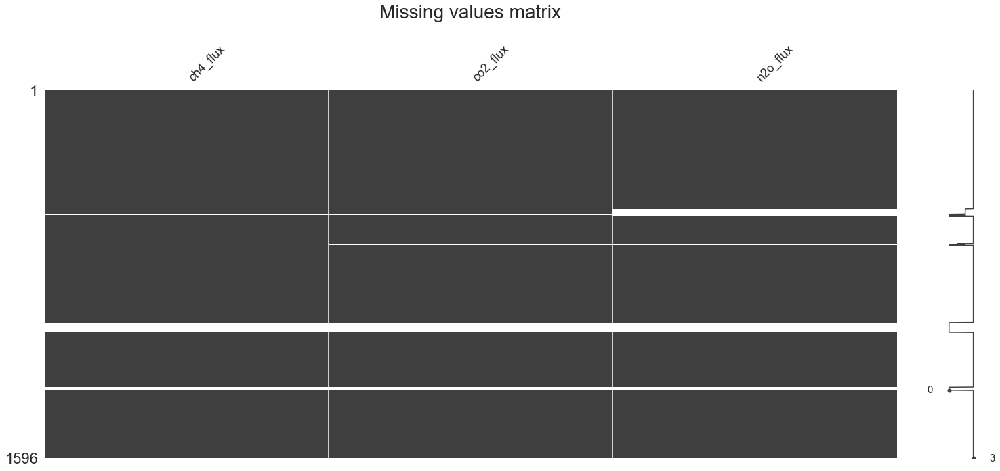


Summary of missing data: 
          missing  total  percent
n2o_flux       93   1596    5.827
co2_flux       66   1596    4.135
ch4_flux       60   1596    3.759



In [12]:
def missing_values_matrix_plot(dataframe, title, plot_name):
    """Check missing values from the initial clean-up procedure.

    A table of "nan" (for, "not a number") is built, which describes the number
        of "non-nans" (i.e. non-missing), the number of nan values for each
        columns in the dataset, and their percentage.

    A matrix plot is built, representing visually where the missing values are
        situated in the dataset.

    Args:
        dataframe (object): the whole dataset, not the numerical variables as
            in the previous funcion.
        title (string): name of the graph title.
        plot_name (string): name of the figure file saved (as .png file).

    Returns:
        tuple: two dataframes, one for the nan table and the other for the
        matrix plot.
    """
    title = title
    plot_name = plot_name

    matrix_plot = msno.matrix(dataframe, fontsize=18)
    plt.title(title, fontsize=28)
    plt.show()

    # table of % of missing values using the "sidetable" library instead
    # of performing the task manually
    nan_table = dataframe.stb.missing(
        clip_0=True,
        # style=True  # not working?
    )
    print(f"\nSummary of missing data: \n{nan_table}\n")
    return matrix_plot, nan_table


matrix_plot, nan_table = missing_values_matrix_plot(
    dep_vars_clean,
    title="Missing values matrix\n",
    plot_name="dep_vars_clean_check_missing_data_raw_matrix",
)



In [13]:
def detect_high_corr_w_dependent_variable(
    dataframe, correlation_threshold_value=0.8
):
    """Check correlation among independant varibles.

    And check which two features have a strong correlation.
    First, define the number of variables to consider from dependent variables
    (i.e. "var_size" below). Then, go through all possible correlations.

    Args:
        dataframe (object): back to selecting the dependent variables only.
        correlation_threshold_value (float, optional): limit of the correlation
            factor between the variables. Defaults to 0.8, but it can be
            increased/lowered depending on the nature of dataset, such as
            statistical power and number of variables to analyse.

    Returns:
        float: dataframe with the correlation values of the highly correlated
        variables.
    """
    vars_size = len(dataframe.columns)
    correlation_threshold_value = correlation_threshold_value
    vars_range = dataframe.iloc[:, :vars_size]
    cols = vars_range.columns
    data_corr = vars_range.corr()
    high_corr_list = ()

    # search for the highly correlated pairs
    for var_position in range(0, vars_size):
        for value in range(var_position + 1, vars_size):  # avoid repetition
            if (
                data_corr.iloc[var_position, value]
                >= correlation_threshold_value
                and data_corr.iloc[var_position, value] < 1
            ) or (
                data_corr.iloc[var_position, value] < 0
                and data_corr.iloc[var_position, value]
                <= -correlation_threshold_value
            ):
                high_corr_list.append(
                    [data_corr.iloc[var_position, value], var_position, value]
                )  # store correlation and columns index

    for corr_value, var_position, value in high_corr_list:
        print(
            f"\nThe highly correlated variable pairs are: "
            f"{cols[var_position]} and {cols[value]} = {corr_value:.1%}"
        )
    else:
        print(f"\nThere are no highly correlated variables pairs")
        # print("None")
    return high_corr_list


high_corr_list = detect_high_corr_w_dependent_variable(
    dep_vars_clean, correlation_threshold_value=0.8,
)




There are no highly correlated variables pairs


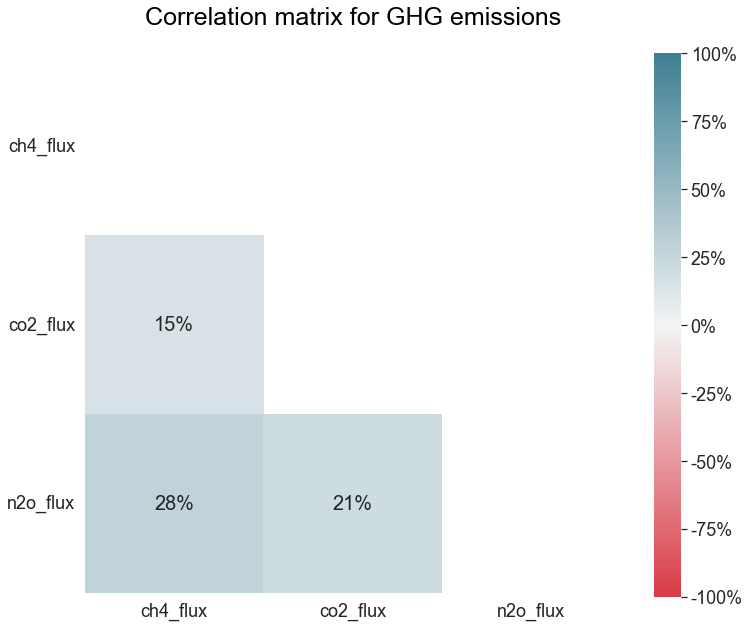

,ch4_flux,co2_flux,n2o_flux
ch4_flux,1.000,0.153,0.284
co2_flux,0.153,1.000,0.208
n2o_flux,0.284,0.208,1.000


In [14]:
def heatmap_correlation_plot(dataframe, title, plot_name, file_name):
    """Draw a heatmap of dependent variabless correlations between each others.

    Also, save correlation table between dependent variables as a .csv file.

    Args:
        dataframe (object): dependent variables.
        title (string): name of the graph title.
        plot_name (string): name of the figure file saved (as .png file).
        file_name (string): name of the .csv file saving the correlation table.

    Returns:
        object: correlation table
    """
    title = title
    plot_name = plot_name

    plt.figure(figsize=(12, 10))
    correlation_matrix = dataframe.corr(method="pearson")
    heatmap = sns.heatmap(
        correlation_matrix,
        annot=True,
        annot_kws={"size": 20},
        vmin=-1,
        vmax=1,
        center=0,
        fmt=".0%",
        cmap=sns.diverging_palette(10, 220, sep=5, n=99, as_cmap=True),
        square=True,
        mask=np.triu(np.ones_like(correlation_matrix, dtype=np.bool)),
    )
    cbar = heatmap.collections[0].colorbar
    cbar.ax.tick_params(labelsize=18)
    cbar.set_ticks([-1, -0.75, -0.5, -0.25, 0, 0.25, 0.50, 0.75, 1])
    cbar.set_ticklabels(
        ["-100%", "-75%", "-50%", "-25%", "0%", "25%", "50%", "75%", "100%"]
    )
    # heatmap.set_xlabel("xlabel", fontsize=20)
    heatmap.set_xticklabels(
        heatmap.get_xticklabels(),
        rotation=0,
        horizontalalignment="center",
        fontsize=18,
    )
    # heatmap.set_ylabel("ylabel", fontsize=20)
    heatmap.set_yticklabels(
        heatmap.get_yticklabels(),
        rotation=0,
        verticalalignment="center",
        fontsize=18,
    )
    heatmap.set_title(
        title,
        fontdict={"fontsize": 25, "fontweight": 5, "color": "black"},
        pad=6,
    )
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()

    correlation_matrix.to_csv(
        file_path_save + file_name + ".csv",
        sep=",",
        encoding="utf-8",
        na_rep="nan",
        header=True,
        index=True,
    )
    return correlation_matrix


heatmap_correlation_plot(
    dep_vars_clean,
    title="Correlation matrix for GHG emissions\n",
    plot_name="dep_vars_clean_heatmap_corr_plot",
    file_name="dep_vars_clean_correlation_matrix",
)



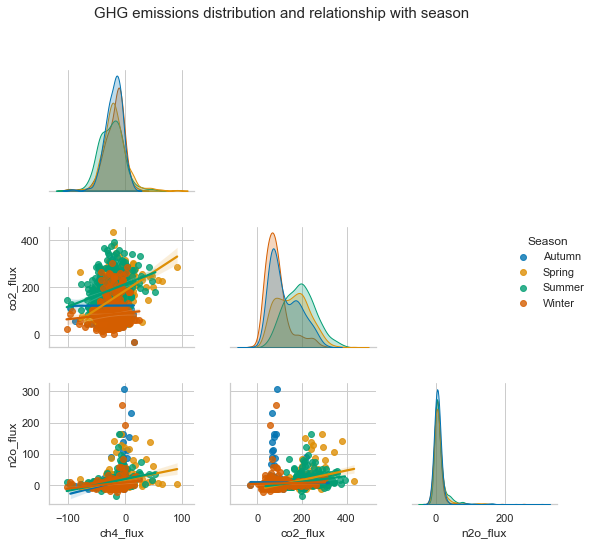

In [15]:
def pair_plot(dataframe, hue, title, plot_name):
    """Draw a group of scatter plots paired with distribution densities.

    Using the concatenation of the "Season" variable from the original dataset
    with the "dep_vars_clean" dataframe (see operation earlier on) to display
    the influence of the season on the dependent variables.

    Args:
        dataframe (object): dependent variables dataframe with "Season".
        hue (string): "Season" is the grouping factor as seen in the legend.
        title (string): name of the graph title.
        plot_name (string): name of the figure file saved (as .png file).

    Returns:
        object: image file and pair plot object.
    """
    title = title
    plot_name = plot_name

    pair_plot = sns.pairplot(
        dataframe,
        kind="reg",
        diag_kind="kde",
        hue=hue,
        # palette="husl",  # disabled to favour "colorblind" setting at start
        corner=True,
        dropna=False,
        size=2.5,
    )
    # # CANNOT change position of the legend
    # plt.legend(title="Season", loc="center right")  # or loc="upper right"
    plt.tight_layout(pad=3)
    plt.suptitle(title, y=1.05, fontsize=15)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return pair_plot


pair_plot(
    dep_vars_clean_w_season,
    hue="Season",
    title="GHG emissions distribution and relationship with season\n",
    plot_name="dep_vars_clean_season_pair_plot",
)



In [16]:
# NOT working within VS Code BUT working with Interactive Jupyter...
def scatter_matrix_interactive(dataframe):
    """Draw a group of scatter plots paired with distribution densities.

    This version of the pair plot above has interactive properties thanks to
    the use of the "plotly" and "cufflinks" libraries.

    Args:
        dataframe (object): dependent variables dataframe with "Season".

    Returns:
        object: image file and pair plot object.
    """
    cf.go_offline()
    scatter_matrix = dataframe.scatter_matrix()

    return scatter_matrix


scatter_matrix_interactive(dep_vars_clean)



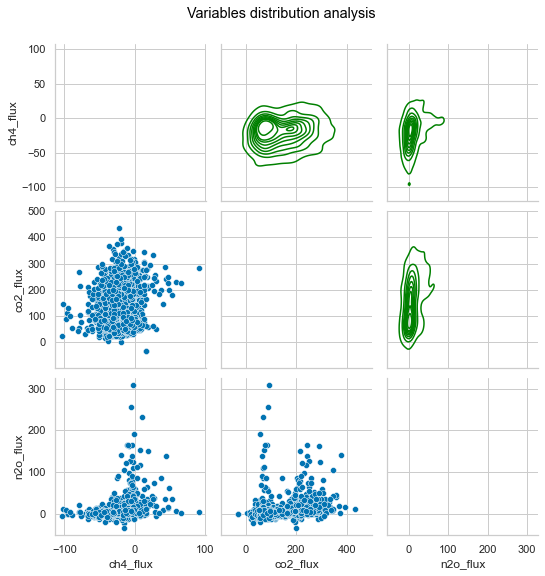

In [17]:
def pair_grid(dataframe, hue=None):
    """Show data pattern, similar to above.

    Here, the corralation factors are displayed on the graph.

    Args:
        dataframe (object): display relationships between variables.
        hue (string, optional): add a grouping factor. Defaults to None.

    Returns:
        object: image file and pair grid object.
    """

    def corrfunc(x_value, y_value, **kwargs):
        """Calculate correlation values between numeric variables.

        Args:
            x_value (series): one variable amongst the numerical variables
            y_value (series): another numerical variable
        """
        rho_value, p_value = stats.pearsonr(x_value, y_value)
        ax = plt.gca()
        rho_label = r"$\rho$"
        ax.annotate(
            f"{rho_label} = {rho_value:.3f}",
            fontsize=12,
            xy=(0.56, 0.90),
            xycoords=ax.transAxes,
        )
        ax.annotate(
            f"p-value = {p_value:.3f}",
            fontsize=12,
            xy=(0.35, 0.80),
            xycoords=ax.transAxes,
        )

    pair_grid = sns.PairGrid(
        dataframe, hue=hue, corner=False, dropna=True, layout_pad=0,
    )
    pair_grid.map_upper(sns.kdeplot, color="green")
    pair_grid.map_upper(corrfunc)
    pair_grid.map_diag(sns.distplot, color="orange")
    pair_grid.map_lower(sns.scatterplot)

    plt.suptitle(
        "Variables distribution analysis",
        y=1.05,
        fontdict={"fontsize": 25, "fontweight": 5, "color": "black"},
    )
    plt.show()
    return pair_grid


pair_grid(dep_vars_clean_w_season_co2_treatment)



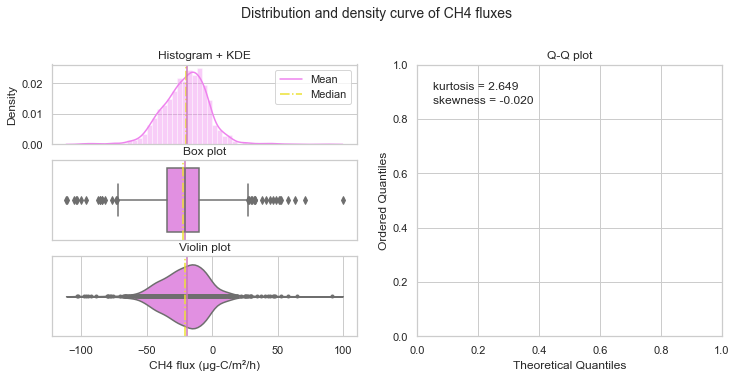

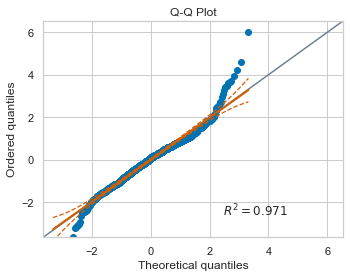

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CH4 flux (µg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

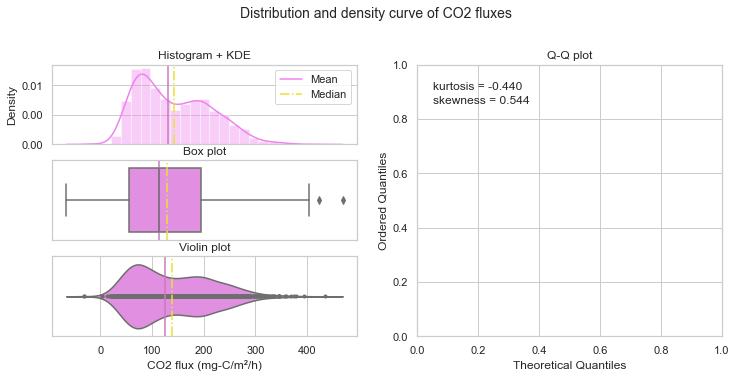

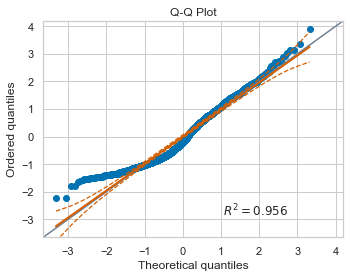

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CO2 flux (mg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

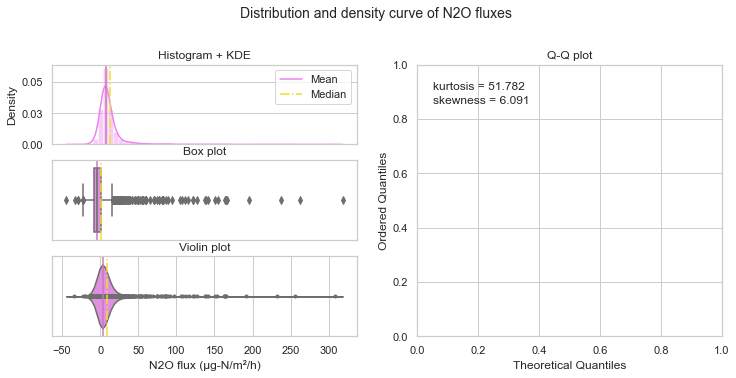

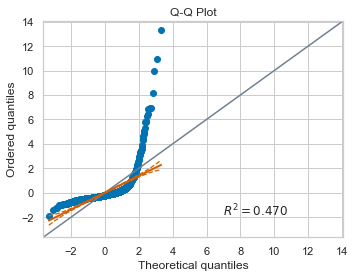

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='N2O flux (µg-N/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

In [18]:
def distribution_plot(dataframe, title, plot_name, xlabel):
    """Display variables distribution.

    Check normality visually (qualitative approach).
    One plot regroups a distribution histogram, a box plot and a violin plot.
    A loop was writen to draw a plot for each dependent variable.

    Cannot add Q-Q plot on top of the main figure plot.
    Had to be created independently.

    Args:
        dataframe (object): individual variable (series).
        title (string): name of the graph title.
        plot_name (string): name of the figure file saved (as .png file).
        xlabel (string): define the dependent variable being investigated.
        title_qq (string): title of the extra Q-Q plot.
        plot_name_qq (string): plot name of the figure file.

    Returns:
        tuple: four plots produced: distribution, box, violin and Q-Q plots.
    """
    title = title
    plot_name = plot_name

    plt.figure(figsize=(12, 5))
    plt.suptitle(title, y=1.04, fontsize=14, horizontalalignment="center")

    ax_hist = plt.subplot2grid((3, 2), (0, 0), colspan=1)
    dist_plot = sns.distplot(dataframe, color="violet",)
    ax_hist.set(
        title="Histogram + KDE",
        xlabel="",
        xticklabels=[],
        xticks=[],
        ylabel="Density",
        # yticklabels=[],
        # yticks=[],
    )
    ax_hist.yaxis.set_major_formatter(mtick.FormatStrFormatter("%.2f"))
    ax_hist.axvline(dataframe.mean(), color="y", linestyle="-.")
    ax_hist.axvline(dataframe.median(), color="m", linestyle="-")

    plt.legend(labels=("Mean", "Median"), loc="best")

    ax_box = plt.subplot2grid((3, 2), (1, 0), colspan=1)
    box_plot = sns.boxplot(dataframe, orient="horizontal", color="violet",)
    ax_box.set(
        title="Box plot",
        xlabel="",
        xticklabels=[],
        xticks=[],
        # ylabel=[],
        # yticklabels=[],
        yticks=[],
    )
    ax_box.axvline(dataframe.mean(), color="y", linestyle="-.")
    ax_box.axvline(dataframe.median(), color="m", linestyle="-")

    ax_violin = plt.subplot2grid((3, 2), (2, 0), colspan=1)
    violin_plot = sns.violinplot(
        dataframe, orient="horizontal", color="violet", inner="points",
    )
    ax_violin.set(
        title="Violin plot",
        xlabel=xlabel,
        # xticklabels=[],
        # xticks=[],
        # ylabel=[],
        yticklabels=[],
        yticks=[],
    )
    ax_violin.axvline(dataframe.mean(), color="y", linestyle="-.")
    ax_violin.axvline(dataframe.median(), color="m", linestyle="-")

    ax_qq = plt.subplot2grid((3, 2), (0, 1), rowspan=3)
    qq_plot = pg.qqplot(dataframe, dist="norm")
    ax_qq.set(
        title="Q-Q plot",
        xlabel="Theoretical Quantiles",
        ylabel="Ordered Quantiles",
    )
    ax_qq.text(
        0.05,
        0.90,
        f"kurtosis = {dataframe.kurt():.3f}",
        verticalalignment="bottom",
        fontsize=12,
    )
    ax_qq.text(
        0.05,
        0.85,
        f"skewness = {dataframe.skew():.3f}",
        verticalalignment="bottom",
        fontsize=12,
    )
    plt.tight_layout(pad=1)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return dist_plot, box_plot, violin_plot, qq_plot


distribution_plot(
    dep_vars_clean["ch4_flux"],
    title="Distribution and density curve of CH4 fluxes\n",
    plot_name="ch4_flux_data_clean_distrib_histo_plot",
    xlabel="CH4 flux (µg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean["co2_flux"],
    title="Distribution and density curve of CO2 fluxes\n",
    plot_name="co2_flux_data_clean_distrib_histo_plot",
    xlabel="CO2 flux (mg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean["n2o_flux"],
    title="Distribution and density curve of N2O fluxes\n",
    plot_name="n2o_flux_data_clean_distrib_histo_plot",
    xlabel="N2O flux (µg-N/m²/h)",
)



In [19]:
def kurtosis_test(dataframe, alpha):
    """Measure the kurtosis value of each variable.

    Check normality numerically (quantitative approach). As opposed to the
    visual investigation of normality, the production of metrics and
    statistical tests can give further information on data distribution.

    Args:
        dataframe (object): dependent variables being investigated.
        alpha (float): statistical threshold for the kurtosis method.

    Returns:
        tuple: floats for kurtosis value and test p-value output.
    """
    kurtosis = dataframe.kurt(skipna=True)
    print(f"\nVariables' kurtosis values: \n{kurtosis}\n")

    alpha = alpha
    kurt_stat_val = lambda x: stats.kurtosistest(x, nan_policy="omit")[1]
    kurt_stat_output = (
        lambda x: stats.kurtosistest(x, nan_policy="omit")[1] > alpha
    )
    kurt_test = pd.DataFrame(
        dataframe.apply([kurt_stat_val, kurt_stat_output])
    )
    print(
        f"\nKurtosis measure \nVariables with normal distribution: "
        f"\n{kurt_test}\n"
    )
    return kurtosis, kurt_test


kurtosis, kurt_test = kurtosis_test(dep_vars_clean, alpha=0.05,)




Variables' kurtosis values: 
ch4_flux     2.649
co2_flux    -0.440
n2o_flux    51.782
dtype: float64


Kurtosis measure 
Variables with normal distribution: 
          ch4_flux  co2_flux  n2o_flux
<lambda>  1.66e-23  6.54e-06  1.8e-116
<lambda>     False     False     False



In [20]:
def skewness_test(dataframe, alpha):
    """Measure the skewness value of each variable.

    Check normality numerically (quantitative approach). As opposed to the
    visual investigation of normality, the production of metrics and
    statistical tests can give further information on data distribution.

    Args:
        dataframe (object): dependent variables being investigated.
        alpha (float): statistical threshold for the skewness method.

    Returns:
        tuple: float for skewness value and test p-value output.
    """
    skewness = dataframe.skew(skipna=True)
    print(f"\nVariables' skewness values: \n{skewness}\n")

    alpha = alpha
    skew_stat_val = lambda x: stats.skewtest(x, nan_policy="omit")[1]
    skew_stat_output = (
        lambda x: stats.skewtest(x, nan_policy="omit")[1] > alpha
    )
    skew_test = pd.DataFrame(
        dataframe.apply([skew_stat_val, skew_stat_output])
    )
    print(
        f"\nSkewness measure \nVariables with normal distribution: "
        f"\n{skew_test}\n"
    )
    return skewness, skew_test


skewness, skew_test = skewness_test(dep_vars_clean, alpha=0.05,)




Variables' skewness values: 
ch4_flux   -0.020
co2_flux    0.544
n2o_flux    6.091
dtype: float64


Skewness measure 
Variables with normal distribution: 
         ch4_flux  co2_flux   n2o_flux
<lambda>    0.746  2.81e-16  4.22e-273
<lambda>     True     False      False



In [21]:
def standard_deviation_outlier_detection(
    dataframe, var_name, cut_off_stdev_value=3
):
    """List the values categorised as outliers with the "stdev" method.

    Set the threshold (cut-off value). Default is 3 standard deviations, but
    set to 4 due to extreme outliers while still considering the "noisy" data.
    Here, tried to detect the one outlier for CO2 flux using stdev=3.5 as
    stdev=4 does not detect it and stdev=3 does not detect many outliers
    for ch4_flux and n2o_flux

    Args:
        dataframe (object): dataframe with all clean values, i.e. the file
            loaded at the beginning of the module.
        var_name (string): name of the variable investigated.
        cut_off_stdev_value (int, optional): the number of standard deviation
            to define samples as outliers. Defaults to 3.

    Returns:
        tuple: two dataframes. One with the total number of outliers detected,
            and the other with the list a values defined as outliers.
    """
    # calculate the outlier cut-off value
    cut_off_value = dataframe[var_name].std() * cut_off_stdev_value
    lower_limit, upper_limit = (
        dataframe[var_name].mean() - cut_off_value,
        dataframe[var_name].mean() + cut_off_value,
    )
    # outliers detection
    dataframe_outliers = dataframe[var_name][
        (dataframe[var_name] < lower_limit)
        | (dataframe[var_name] > upper_limit)
    ]
    dataframe_outliers = pd.DataFrame(dataframe_outliers).rename(
        columns={var_name: f"{var_name}_stdev_outliers"}
    )
    print(
        f"\nNumber of {var_name} stdev-outliers identified: "
        f"{dataframe_outliers.shape[0]}\n"
        f"\nList of {var_name} stdev-outliers: "
        f"\n{dataframe_outliers}\n"
    )
    # outliers removal
    dataframe_no_outliers = dataframe[var_name][
        (dataframe[var_name] >= lower_limit)
        & (dataframe[var_name] <= upper_limit)
    ]
    dataframe_no_outliers = pd.DataFrame(
        dataframe_no_outliers, index=dataframe.index,
    ).rename(columns={var_name: f"{var_name}_stdev_no_outliers"})
    return dataframe_outliers, dataframe_no_outliers


# # there is an issue here since the variables have to be declared
# # independently to be part of the global scope
# for var_name in dep_vars_list:
#     var_outliers = f"dep_vars_{var_name}_stdev_outliers"
#     var_no_outliers = f"dep_vars_{var_name}_stdev_no_outliers"
#     var_outliers, var_no_outliers = standard_deviation_outlier_detection(
#         dep_vars_clean, var_name, cut_off_stdev_value=3.5,
#     )
(
    ch4_flux_stdev_outliers,
    ch4_flux_stdev_no_outliers,
) = standard_deviation_outlier_detection(
    dep_vars_clean, var_name="ch4_flux", cut_off_stdev_value=3.5,
)
(
    co2_flux_stdev_outliers,
    co2_flux_stdev_no_outliers,
) = standard_deviation_outlier_detection(
    dep_vars_clean, var_name="co2_flux", cut_off_stdev_value=3.5,
)
(
    n2o_flux_stdev_outliers,
    n2o_flux_stdev_no_outliers,
) = standard_deviation_outlier_detection(
    dep_vars_clean, var_name="n2o_flux", cut_off_stdev_value=3.5,
)




Number of ch4_flux stdev-outliers identified: 14

List of ch4_flux stdev-outliers: 
                 ch4_flux_stdev_outliers
SampleTrackerNo                         
2690                             -96.300
4952                              47.996
4962                              91.145
4964                              57.645
4965                              64.655
4752                              46.952
5335                            -102.522
5360                             -94.968
8244                            -102.921
6323                             -88.831
8267                             -97.657
8269                             -92.566
13339                             52.882
15235                             46.439


Number of co2_flux stdev-outliers identified: 1

List of co2_flux stdev-outliers: 
                 co2_flux_stdev_outliers
SampleTrackerNo                         
8839                             434.025


Number of n2o_flux stdev-outliers identified: 23


In [22]:
def interquantile_outlier_detection(
    dataframe, var_name, lower_quantile=0.25, higher_quantile=0.75,
):
    """Detect outliers based on the variation of the IQR range.

    Here, the chosen quantiles were the percentiles 1% and 99% as the flux
    data are very noisy are and very extreme values should be removed from
    the dataset.

    Args:
        dataframe (object): dataframe being investigated.
        var_name (string): name of the variable investigated.
        lower_quantile (float, optional): [description]. Defaults to 0.25.
        higher_quantile (float, optional): [description]. Defaults to 0.75.

    Returns:
        tuple: two dataframes. "outliers" contains the rows outside
            the percentale threshold. "no_outliers" contains the sample values
            within the quantile range.
    """
    lower_limit, upper_limit = (
        dataframe[var_name].quantile(lower_quantile),
        dataframe[var_name].quantile(higher_quantile),
    )
    # outliers detection
    dataframe_outliers = dataframe[var_name][
        (dataframe[var_name] < lower_limit)
        | (dataframe[var_name] > upper_limit)
    ]
    dataframe_outliers = pd.DataFrame(dataframe_outliers).rename(
        columns={var_name: f"{var_name}_iqr_outliers"}
    )
    print(
        f"\nNumber of {var_name} IQR-outliers identified: "
        f"{dataframe_outliers.shape[0]}\n"
        f"\nList of {var_name} IQR-outliers: "
        f"\n{dataframe_outliers}\n"
    )

    # outliers removal
    dataframe_no_outliers = dataframe[var_name][
        (dataframe[var_name] >= lower_limit)
        & (dataframe[var_name] <= upper_limit)
    ]
    dataframe_no_outliers = pd.DataFrame(
        dataframe_no_outliers, index=dataframe.index,
    ).rename(columns={var_name: f"{var_name}_iqr_no_outliers"})
    return dataframe_outliers, dataframe_no_outliers


# # same issues as earlier since the variables have to be declared
# # independently to be part of the global scope
# for var_name in dep_vars_list:
#     (
#         dep_vars_iqr_outliers,
#         dep_vars_iqr_no_outliers,
#     ) = interquantile_outlier_detection(
#         dep_vars_clean_no_transform,
#         var_name,
#         lower_quantile=0.01,
#         higher_quantile=0.99,
#     )
(
    ch4_flux_iqr_outliers,
    ch4_flux_iqr_no_outliers,
) = interquantile_outlier_detection(
    dep_vars_clean,
    var_name="ch4_flux",
    lower_quantile=0.01,
    higher_quantile=0.99,
)
(
    co2_flux_iqr_outliers,
    co2_flux_iqr_no_outliers,
) = interquantile_outlier_detection(
    dep_vars_clean,
    var_name="co2_flux",
    lower_quantile=0.01,
    higher_quantile=0.99,
)
(
    n2o_flux_iqr_outliers,
    n2o_flux_iqr_no_outliers,
) = interquantile_outlier_detection(
    dep_vars_clean,
    var_name="n2o_flux",
    lower_quantile=0.01,
    higher_quantile=0.99,
)




Number of ch4_flux IQR-outliers identified: 32

List of ch4_flux IQR-outliers: 
                 ch4_flux_iqr_outliers
SampleTrackerNo                       
4134                           -67.791
4148                            29.403
2690                           -96.300
4942                            37.159
4947                            44.138
4952                            47.996
4962                            91.145
4963                            28.780
4964                            57.645
4965                            64.655
4731                            40.124
4752                            46.952
5335                          -102.522
5357                           -77.393
5360                           -94.968
8234                           -79.452
8244                          -102.921
8245                           -70.448
8191                           -80.572
6323                           -88.831
8267                           -97.657
8269                  


Final dataframe info: 

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 1596 entries, 4125 to 16098
Data columns (total 6 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ch4_flux_stdev_no_outliers  1522 non-null   float64
 1   ch4_flux_iqr_no_outliers    1504 non-null   float64
 2   co2_flux_stdev_no_outliers  1529 non-null   float64
 3   co2_flux_iqr_no_outliers    1498 non-null   float64
 4   n2o_flux_stdev_no_outliers  1480 non-null   float64
 5   n2o_flux_iqr_no_outliers    1471 non-null   float64
dtypes: float64(6)
memory usage: 130.1 KB

None


Dataset shape: 1596 rows and 6 columns

Dataset preview: 
                 ch4_flux_stdev_no_outliers  ch4_flux_iqr_no_outliers  \
SampleTrackerNo                                                         
15511                               -43.142                   -43.142   
15470                               -18.433                   -18.433   
414

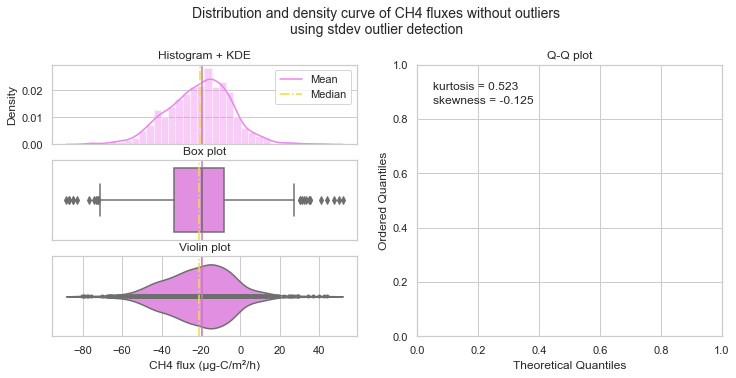

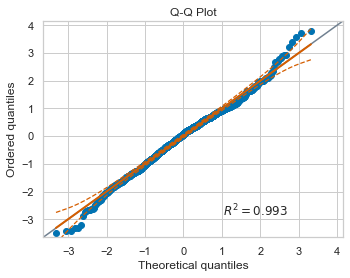

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CH4 flux (µg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

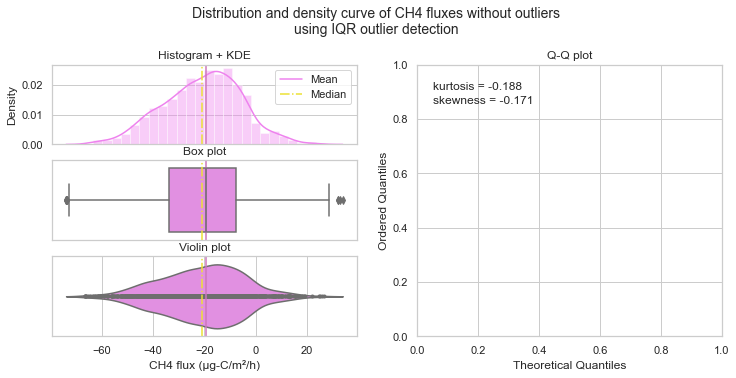

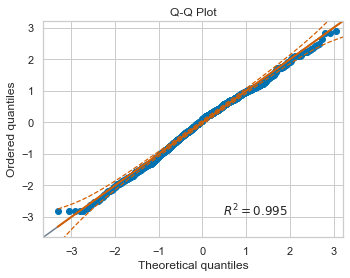

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CH4 flux (µg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

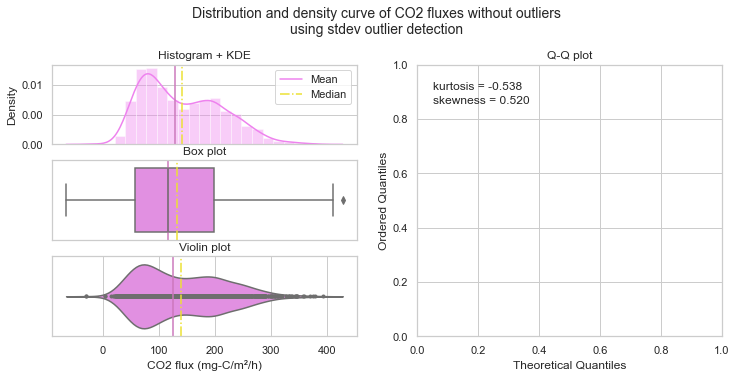

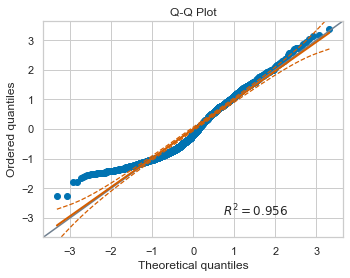

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CO2 flux (mg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

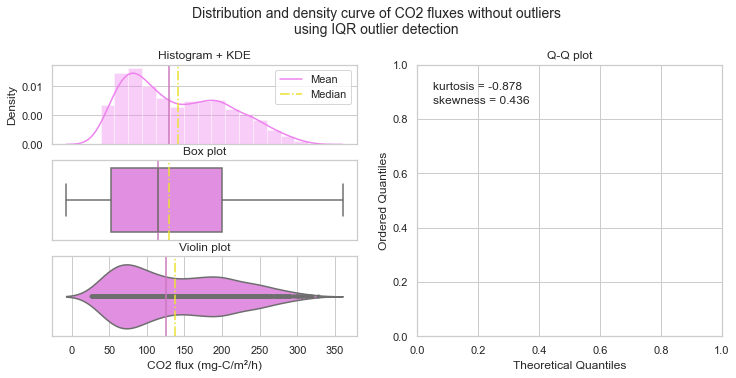

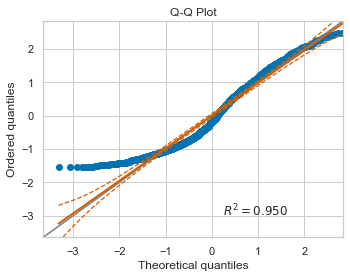

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='CO2 flux (mg-C/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

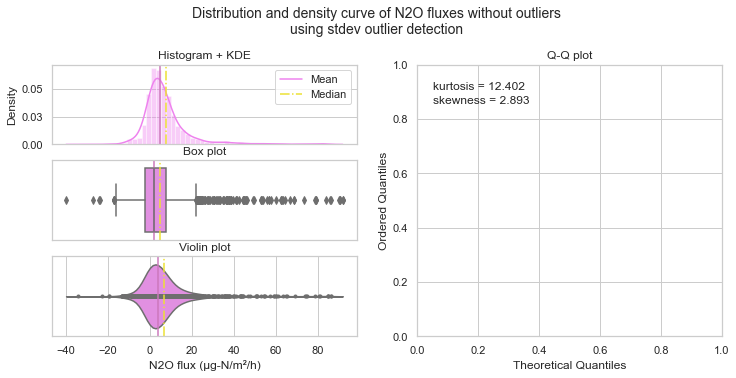

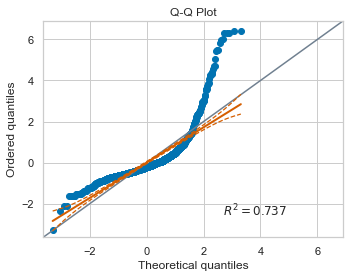

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='N2O flux (µg-N/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

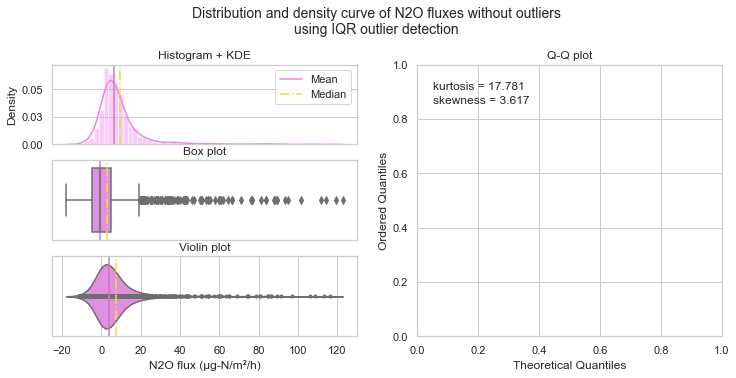

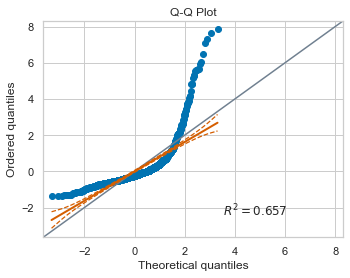

(<AxesSubplot:title={'center':'Histogram + KDE'}, ylabel='Density'>,
 <AxesSubplot:title={'center':'Box plot'}>,
 <AxesSubplot:title={'center':'Violin plot'}, xlabel='N2O flux (µg-N/m²/h)'>,
 <AxesSubplot:title={'center':'Q-Q Plot'}, xlabel='Theoretical quantiles', ylabel='Ordered quantiles'>)

In [23]:
def concatenate_stdev_iqr_no_outliers():
    """Concatenate the three sets of dependent variables without outliers.

    This is done for both (standard deviation & IQR) outlier detection methods.

    Returns:
        object: one dataframe with concatenated variables.
    """
    no_outliers_dataframes = [
        ch4_flux_stdev_no_outliers,
        ch4_flux_iqr_no_outliers,
        co2_flux_stdev_no_outliers,
        co2_flux_iqr_no_outliers,
        n2o_flux_stdev_no_outliers,
        n2o_flux_iqr_no_outliers,
    ]

    dataframes_no_outliers = pd.concat(
        no_outliers_dataframes, sort=False, axis=1, join="inner"
    )
    print(f"\nFinal dataframe info: \n")
    print(f"\n{dataframes_no_outliers.info()}\n")
    return dataframes_no_outliers


dep_vars_clean_no_outliers = concatenate_stdev_iqr_no_outliers()

dep_vars_clean_no_outliers_eda = exploratory_data_analysis(
    dep_vars_clean_no_outliers,
    eda_summary="eda_summary_dep_vars_clean_no_outliers",
    file_name="dep_vars_clean_no_outliers_eda",
)

# refactor code below to avoid repeating the same function call
distribution_plot(
    dep_vars_clean_no_outliers["ch4_flux_stdev_no_outliers"],
    title=f"Distribution and density curve of CH4 fluxes without outliers\n"
    f"using stdev outlier detection",
    plot_name="ch4_flux_data_clean_stdev_no_outliers_distrib_histo_plot",
    xlabel="CH4 flux (µg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean_no_outliers["ch4_flux_iqr_no_outliers"],
    title=f"Distribution and density curve of CH4 fluxes without outliers\n"
    f"using IQR outlier detection",
    plot_name="ch4_flux_data_clean_iqr_no_outliers_distrib_histo_plot",
    xlabel="CH4 flux (µg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean_no_outliers["co2_flux_stdev_no_outliers"],
    title=f"Distribution and density curve of CO2 fluxes without outliers\n"
    f"using stdev outlier detection",
    plot_name="co2_flux_data_clean_stdev_no_outliers_distrib_histo_plot",
    xlabel="CO2 flux (mg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean_no_outliers["co2_flux_iqr_no_outliers"],
    title=f"Distribution and density curve of CO2 fluxes without outliers\n"
    f"using IQR outlier detection",
    plot_name="co2_flux_data_clean_iqr_no_outliers_distrib_histo_plot",
    xlabel="CO2 flux (mg-C/m²/h)",
)
distribution_plot(
    dep_vars_clean_no_outliers["n2o_flux_stdev_no_outliers"],
    title=f"Distribution and density curve of N2O fluxes without outliers\n"
    f"using stdev outlier detection",
    plot_name="n2o_flux_data_clean_stdev_no_outliers_distrib_histo_plot",
    xlabel="N2O flux (µg-N/m²/h)",
)
distribution_plot(
    dep_vars_clean_no_outliers["n2o_flux_iqr_no_outliers"],
    title=f"Distribution and density curve of N2O fluxes without outliers\n"
    f"using IQR outlier detection",
    plot_name="n2o_flux_data_clean_iqr_no_outliers_distrib_histo_plot",
    xlabel="N2O flux (µg-N/m²/h)",
)
# # below NOT working as it gives the following error message:
# # ValueError: The truth value of a Series is ambiguous.
# # Use a.empty, a.bool(), a.item(), a.any() or a.all().
# distribution_plot(
#     dep_vars_clean_no_outliers,
#     title="Distribution and density curve of N2O fluxes without outliers\n",
#     plot_name="n2o_flux_data_clean_no_outliers_distrib_histo_plot",
#     xlabel="N2O flux (µg-N/m²/h)",
# )



In [24]:
# below variable created to indicate that the variables are not transformed yet
dep_vars_clean_no_transform = dep_vars_clean.copy()



In [25]:
# set-up a "Class" instance or a "Pipeline" of transforms (from scikit-learn)



In [26]:
def standardisation(dataframe, var_name_1, var_name_2, var_name_3):
    """Standardised scaling (generation of a numpy array).

    Scales are not the same for all variables. Hence, rescaling and
    standardization may be necessary for some algorithms.

    Convert the numpy array to a dataframe and label columns.

    Args:
        dataframe (object): raw (non-transformed) data to be scaled.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: scaled dependent variables.
    """
    std_scaler = StandardScaler()
    dataframe_standardisation = std_scaler.fit_transform(dataframe)
    dataframe_std = pd.DataFrame(
        {
            var_name_1 + "_std": dataframe_standardisation[:, 0],
            var_name_2 + "_std": dataframe_standardisation[:, 1],
            var_name_3 + "_std": dataframe_standardisation[:, 2],
        },
        index=dataframe.index,
    )
    print(f"\nStandardisation of ghg flux raw data: " f"\n{dataframe_std}\n")
    return dataframe_std


dep_vars_clean_transform_std = standardisation(
    dep_vars_clean_no_transform,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_std_eda = exploratory_data_analysis(
    dep_vars_clean_transform_std,
    eda_summary="eda_summary_dep_vars_clean_transform_std",
    file_name="dep_vars_clean_transform_std_eda",
)




Standardisation of ghg flux raw data: 
                 ch4_flux_std  co2_flux_std  n2o_flux_std
SampleTrackerNo                                          
4125                    0.188        -1.187        -0.575
4126                   -0.070        -1.255        -0.461
4127                   -0.247        -1.236        -0.327
4128                   -0.130        -1.070        -0.261
4129                   -1.134        -1.128        -0.504
...                       ...           ...           ...
16094                   0.583        -0.551         0.002
16095                   0.215        -0.576        -0.535
16096                   0.471        -0.748        -0.278
16097                   0.789        -0.596        -0.081
16098                   0.390        -1.164        -0.012

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset preview: 
                 ch4_flux_std  co2_flux_std  n2o_flux_std
SampleTrackerNo                                          
3387 

In [27]:
def min_max_transform(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply MinMax normalisation (generation of a numpy array).

    Convert the numpy array to a dataframe and label columns.

    Args:
        dataframe (object): raw (non-transformed) data to be normalised.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: normalised dependent variables.
    """
    min_max_scaler = MinMaxScaler()
    dataframe_min_max_transform = min_max_scaler.fit_transform(dataframe)
    dataframe_min_max = pd.DataFrame(
        {
            var_name_1 + "_MinMax": dataframe_min_max_transform[:, 0],
            var_name_2 + "_MinMax": dataframe_min_max_transform[:, 1],
            var_name_3 + "_MinMax": dataframe_min_max_transform[:, 2],
        },
        index=dataframe.index,
    )
    print(
        f"\nMinMax transformation of ghg flux raw data: "
        f"\n{dataframe_min_max}\n"
    )
    return dataframe_min_max


dep_vars_clean_transform_min_max = min_max_transform(
    dep_vars_clean_no_transform,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_min_max_eda = exploratory_data_analysis(
    dep_vars_clean_transform_min_max,
    eda_summary="eda_summary_dep_vars_clean_transform_min_max",
    file_name="dep_vars_clean_transform_min_max_eda",
)




MinMax transformation of ghg flux raw data: 
                 ch4_flux_MinMax  co2_flux_MinMax  n2o_flux_MinMax
SampleTrackerNo                                                   
4125                       0.441            0.171            0.088
4126                       0.416            0.160            0.096
4127                       0.399            0.163            0.105
4128                       0.411            0.190            0.109
4129                       0.314            0.181            0.093
...                          ...              ...              ...
16094                      0.479            0.275            0.126
16095                      0.444            0.271            0.091
16096                      0.468            0.243            0.108
16097                      0.499            0.268            0.121
16098                      0.461            0.175            0.125

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset preview:

In [28]:
def normalisation(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply normalised transformation.

    The "Normalizer()" method requires the use of a dataframe WITHOUT missing
    {NaN values) for the normalisation procedure.

    The ".dropna()" method was applied to delete nan values and normalisation
    was applied.
    Convert the numpy array to a dataframe and label columns.

    Then, merge the normalised variables back to the original dataset using
    "ch4_flux" to reset the "SampleTrackerNo" index to replace the rows that
    were removed during the "normalisation" step. Finally, drop the "ch4_flux"
    variable to keep the new dataframe tidy.

    Args:
        dataframe (object): raw (non-transformed) data to be normalised.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: normalised dependent variables.
    """
    # remove NaN values from dataframe
    if dataframe.isna().sum().sum() > 0:
        mask_total = dataframe.isna().sum()
        total = mask_total[mask_total > 0]

        mask_percent = dataframe.isna().mean() * 100
        percent = mask_percent[mask_percent > 0]

        missing_data = pd.concat(
            [total, percent], keys=["Total", "Percent"], sort=False, axis=1,
        )
        print(f"\nTotal and Percentage of NaNs: \n{missing_data}\n")
    else:
        print("No NaN found.")

    print(
        f"\nDependent variables data shape: "
        f"\n{dataframe.shape[0]} rows and {dataframe.shape[1]} columns\n"
    )
    dataframe_no_nans = dataframe.copy()
    dataframe_no_nans.dropna(axis=0, how="any", inplace=True)
    print(
        f"\nDependent variables data shape WITHOUT NaN values: "
        f"\n{dataframe_no_nans.shape[0]} rows "
        f"and {dataframe_no_nans.shape[1]} columns\n"
    )
    # normalised transformation
    normaliser = Normalizer()
    dataframe_normalisation = normaliser.fit_transform(dataframe_no_nans)
    dataframe_norm = pd.DataFrame(
        {
            var_name_1 + "_norm": dataframe_normalisation[:, 0],
            var_name_2 + "_norm": dataframe_normalisation[:, 1],
            var_name_3 + "_norm": dataframe_normalisation[:, 2],
        },
        index=dataframe_no_nans.index,
    )
    print(f"\nNormalisation of ghg flux raw data: \n{dataframe_norm}\n")

    # reset index to match deleted value during data normalisation
    # with their original index position
    # try with .join() method ?
    dataframe_norm = pd.merge(
        dep_vars_clean_no_transform[
            "ch4_flux"
        ],  # selected "randomly" for the index
        dataframe_norm,
        how="left",
        on="SampleTrackerNo",
    ).drop("ch4_flux", axis=1)
    print(
        f"\nNew normalised dataframe (with initial number of rows): "
        f"\n{dataframe_norm}\n"
    )
    return dataframe_no_nans, dataframe_norm


dep_vars_clean_no_nans, dep_vars_clean_transform_norm = normalisation(
    dep_vars_clean_no_transform,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)


dep_vars_clean_transform_norm_eda = exploratory_data_analysis(
    dep_vars_clean_transform_norm,
    eda_summary="eda_summary_dep_vars_clean_transform_norm",
    file_name="dep_vars_clean_transform_norm_eda",
)




Total and Percentage of NaNs: 
          Total  Percent
ch4_flux     60    3.759
co2_flux     66    4.135
n2o_flux     93    5.827


Dependent variables data shape: 
1596 rows and 3 columns


Dependent variables data shape WITHOUT NaN values: 
1502 rows and 3 columns


Normalisation of ghg flux raw data: 
                 ch4_flux_norm  co2_flux_norm  n2o_flux_norm
SampleTrackerNo                                             
4125                    -0.334          0.939         -0.078
4126                    -0.452          0.891         -0.030
4127                    -0.491          0.871          0.029
4128                    -0.373          0.926          0.048
4129                    -0.618          0.785         -0.036
...                        ...            ...            ...
16094                   -0.102          0.991          0.091
16095                   -0.174          0.984         -0.033
16096                   -0.145          0.989          0.032
16097                

In [29]:
def linearisation(dataframe, var_name, dataframe_linear_transform):
    """Apply transform only to dependent variables.

    The square-root (sqrt) and decimal logarithmic (log10) transformations
    take positive values only.
    Thus, linear transformation is applied to make all values positive.
    For this, add the minimum value + 1 to each value for each flux variable.
    This is achieved using a lambda function with the .apply() method.

    Args:
        dataframe (object): load "Series" of dependent variables with
            negative values.
        var_name (string): dependent variable's name.
        dataframe_linear_transform (string): name of the variable's dataframe
            following linearisation.

    Returns:
        object: linearised dependent variables.
    """
    dataframe_min = dataframe[var_name].min()
    print(f"\nMinimum {var_name} value = {dataframe_min:0.3f}")
    dataframe_linear_transform = pd.DataFrame(
        dataframe[var_name].apply(lambda x: x + (-dataframe_min) + 1),
        index=dataframe.index,
    ).rename(columns={var_name: f"{var_name}_linearised"})
    return dataframe_linear_transform


# # same issue as earlier since the variables have to be declared
# # independently to be part of the global scope
# for var_name in dep_vars_list:
#     var_linear = f"dep_vars_{var_name}_transform_linear"
#     var_linear = linearisation(
#         dep_vars_clean_no_transform,
#         var_name,
#         dataframe_linear_transform=f"dep_vars_{var_name}_transform_linear",
#     )
dep_vars_clean_ch4_flux_transform_linear = linearisation(
    dep_vars_clean_no_transform,
    var_name="ch4_flux",
    dataframe_linear_transform="dep_vars_clean_ch4_flux_transform_linear",
)
dep_vars_clean_co2_flux_transform_linear = linearisation(
    dep_vars_clean_no_transform,
    var_name="co2_flux",
    dataframe_linear_transform="dep_vars_clean_co2_flux_transform_linear",
)
dep_vars_clean_n2o_flux_transform_linear = linearisation(
    dep_vars_clean_no_transform,
    var_name="n2o_flux",
    dataframe_linear_transform="dep_vars_clean_n2o_flux_transform_linear",
)




Minimum ch4_flux value = -102.921

Minimum co2_flux value = -30.843

Minimum n2o_flux value = -34.258


In [30]:
def concatenate_linearisations():
    """Concatenate the various linearisations into one dataframe.

    Returns:
        object: concatenated linearisation dataframes.
    """
    linearised_dataframes = [
        dep_vars_clean_ch4_flux_transform_linear,
        dep_vars_clean_co2_flux_transform_linear,
        dep_vars_clean_n2o_flux_transform_linear,
    ]
    dataframe_transform_linear = pd.concat(
        linearised_dataframes, sort=False, axis=1,
    )
    print(f"\nLinearisation of ghg flux: \n{dataframe_transform_linear}\n")
    return dataframe_transform_linear


dep_vars_clean_transform_linear = concatenate_linearisations()

dep_vars_clean_transform_linear_eda = exploratory_data_analysis(
    dep_vars_clean_transform_linear,
    eda_summary="eda_summary_dep_vars_clean_transform_linear",
    file_name="dep_vars_clean_transform_linear_eda",
)




Linearisation of ghg flux: 
                 ch4_flux_linearised  co2_flux_linearised  n2o_flux_linearised
SampleTrackerNo                                                               
4125                          86.616               80.582               31.190
4126                          81.815               75.435               33.770
4127                          78.521               76.892               36.776
4128                          80.707               89.421               38.244
4129                          62.030               85.031               32.800
...                              ...                  ...                  ...
16094                         93.968              128.832               44.151
16095                         87.124              126.920               32.105
16096                         91.877              113.865               37.875
16097                         97.798              125.429               42.300
16098                  

In [31]:
def log10_transform(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply transformation using decimal log (generation of a numpy array).

    Use the variables after linear transformation.

    Args:
        dataframe (object): raw (non-transformed) data to be transformed.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: transformed dependent variables.
    """
    dataframe_log10_transform = pd.DataFrame(
        dataframe.transform(np.log10), index=dataframe.index,
    ).rename(
        columns={
            "ch4_flux_linearised": var_name_1 + "_log10",
            "co2_flux_linearised": var_name_2 + "_log10",
            "n2o_flux_linearised": var_name_3 + "_log10",
        }
    )
    print(
        f"\nDecimal logarithm transformation of ghg flux raw data: "
        f"\n{dataframe_log10_transform}\n"
    )
    return dataframe_log10_transform


dep_vars_clean_transform_log10 = log10_transform(
    dep_vars_clean_transform_linear,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_log10_eda = exploratory_data_analysis(
    dep_vars_clean_transform_log10,
    eda_summary="eda_summary_dep_vars_clean_transform_log10",
    file_name="dep_vars_clean_transform_log10_eda",
)




Decimal logarithm transformation of ghg flux raw data: 
                 ch4_flux_log10  co2_flux_log10  n2o_flux_log10
SampleTrackerNo                                                
4125                      1.938           1.906           1.494
4126                      1.913           1.878           1.529
4127                      1.895           1.886           1.566
4128                      1.907           1.951           1.583
4129                      1.793           1.930           1.516
...                         ...             ...             ...
16094                     1.973           2.110           1.645
16095                     1.940           2.104           1.507
16096                     1.963           2.056           1.578
16097                     1.990           2.098           1.626
16098                     1.956           1.915           1.642

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset preview: 
                 ch4_flux_

In [32]:
def square_root_transform(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply transformation using squre-root (generation of a numpy array).

    Use the variables after linear transformation.

    Args:
        dataframe (object): raw (non-transformed) data to be transformed.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: transformed dependent variables.
    """
    dataframe_sqrt_transform = pd.DataFrame(
        dataframe.transform(np.sqrt), index=dataframe.index,
    ).rename(
        columns={
            "ch4_flux_linearised": var_name_1 + "_sqrt",
            "co2_flux_linearised": var_name_2 + "_sqrt",
            "n2o_flux_linearised": var_name_3 + "_sqrt",
        }
    )
    print(
        f"\nSquare-root transformation of ghg flux raw data: "
        f"\n{dataframe_sqrt_transform}\n"
    )
    return dataframe_sqrt_transform


dep_vars_clean_transform_sqrt = square_root_transform(
    dep_vars_clean_transform_linear,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_sqrt_eda = exploratory_data_analysis(
    dep_vars_clean_transform_sqrt,
    eda_summary="eda_summary_dep_vars_clean_transform_sqrt",
    file_name="dep_vars_clean_transform_sqrt_eda",
)




Square-root transformation of ghg flux raw data: 
                 ch4_flux_sqrt  co2_flux_sqrt  n2o_flux_sqrt
SampleTrackerNo                                             
4125                     9.307          8.977          5.585
4126                     9.045          8.685          5.811
4127                     8.861          8.769          6.064
4128                     8.984          9.456          6.184
4129                     7.876          9.221          5.727
...                        ...            ...            ...
16094                    9.694         11.350          6.645
16095                    9.334         11.266          5.666
16096                    9.585         10.671          6.154
16097                    9.889         11.200          6.504
16098                    9.507          9.073          6.621

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset preview: 
                 ch4_flux_sqrt  co2_flux_sqrt  n2o_flux_sqrt
SampleTrac

In [33]:
def quantile_transform(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply quantile transformation (generation of a numpy array).

    Args:
        dataframe (object): raw (non-transformed) data to be transformed.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: transformed dependent variables.
    """
    quantile_transformer = QuantileTransformer(
        output_distribution="normal", random_state=0
    )
    dataframe_quantile_transform = quantile_transformer.fit_transform(
        dataframe
    )
    dataframe_quantile = pd.DataFrame(
        {
            var_name_1 + "_quant": dataframe_quantile_transform[:, 0],
            var_name_2 + "_quant": dataframe_quantile_transform[:, 1],
            var_name_3 + "_quant": dataframe_quantile_transform[:, 2],
        },
        index=dataframe.index,
    )
    print(
        f"\nQuantile transformation of ghg flux raw data: "
        f"\n{dataframe_quantile}\n"
    )
    return dataframe_quantile


dep_vars_clean_transform_quantile = quantile_transform(
    dep_vars_clean_no_transform,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_quantile_eda = exploratory_data_analysis(
    dep_vars_clean_transform_quantile,
    eda_summary="eda_summary_dep_vars_clean_transform_quantile",
    file_name="dep_vars_clean_transform_quantile_eda",
)




Quantile transformation of ghg flux raw data: 
                 ch4_flux_quant  co2_flux_quant  n2o_flux_quant
SampleTrackerNo                                                
4125                      0.114          -1.365          -1.502
4126                     -0.145          -1.538          -1.066
4127                     -0.310          -1.476          -0.427
4128                     -0.197          -1.093          -0.172
4129                     -1.142          -1.230          -1.292
...                         ...             ...             ...
16094                     0.612          -0.283           0.630
16095                     0.164          -0.317          -1.412
16096                     0.461          -0.527          -0.244
16097                     0.884          -0.336           0.429
16098                     0.394          -1.314           0.590

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset preview: 
                 ch4_flux_quant  co

In [34]:
def robust_scaler_transform(dataframe, var_name_1, var_name_2, var_name_3):
    """Apply scaling transformation (generation of a numpy array).

    Args:
        dataframe (object): raw (non-transformed) data to be scaled.
        var_name_1 (string): first dependent variable's name.
        var_name_2 (string): second dependent variable's name.
        var_name_3 (string): third dependent variable's name.

    Returns:
        object: scaled dependent variables.
    """
    robust_transformer = RobustScaler()
    dataframe_robust_transform = robust_transformer.fit_transform(dataframe)
    dataframe_robust = pd.DataFrame(
        {
            var_name_1 + "_robust": dataframe_robust_transform[:, 0],
            var_name_2 + "_robust": dataframe_robust_transform[:, 1],
            var_name_3 + "_robust": dataframe_robust_transform[:, 2],
        },
        index=dataframe.index,
    )
    print(
        f"\nRobust Scaler transformation of ghg flux raw data: "
        f"\n{dataframe_robust}\n"
    )
    return dataframe_robust


dep_vars_clean_transform_robust = robust_scaler_transform(
    dep_vars_clean_no_transform,
    var_name_1="ch4_flux",
    var_name_2="co2_flux",
    var_name_3="n2o_flux",
)

dep_vars_clean_transform_robust_eda = exploratory_data_analysis(
    dep_vars_clean_transform_robust,
    eda_summary="eda_summary_dep_vars_clean_transform_robust",
    file_name="dep_vars_clean_transform_robust_eda",
)




Robust Scaler transformation of ghg flux raw data: 
                 ch4_flux_robust  co2_flux_robust  n2o_flux_robust
SampleTrackerNo                                                   
4125                       0.090           -0.631           -0.891
4126                      -0.120           -0.674           -0.608
4127                      -0.264           -0.662           -0.279
4128                      -0.168           -0.559           -0.118
4129                      -0.985           -0.595           -0.714
...                          ...              ...              ...
16094                      0.411           -0.235            0.528
16095                      0.112           -0.250           -0.790
16096                      0.320           -0.358           -0.159
16097                      0.578           -0.263            0.326
16098                      0.255           -0.617            0.494

[1596 rows x 3 columns]


Dataset shape: 1596 rows and 3 columns

Dataset p

In [35]:
def concatenate_transformations():
    """Concatenate the various transformation into one dataframe.

    Returns:
        object: concatenated transformation dataframes.
    """
    transformed_dataframes = [
        dep_vars_clean_no_transform,
        dep_vars_clean_no_outliers,
        dep_vars_clean_transform_std,
        dep_vars_clean_transform_min_max,
        dep_vars_clean_transform_norm,
        dep_vars_clean_transform_log10,
        dep_vars_clean_transform_sqrt,
        dep_vars_clean_transform_quantile,
        dep_vars_clean_transform_robust,
    ]
    dataframe_original_transformed = pd.concat(
        transformed_dataframes, sort=False, axis=1, join="inner",
    )
    print(
        f"\nConcatenation of data transformations: "
        f"\n{dataframe_original_transformed}\n"
    )
    return dataframe_original_transformed


dep_vars_clean_original_transformed_no_outliers = concatenate_transformations()




Concatenation of data transformations: 
                 ch4_flux  co2_flux  n2o_flux  ch4_flux_stdev_no_outliers  \
SampleTrackerNo                                                             
4125              -17.305    48.739    -4.068                     -17.305   
4126              -22.106    43.592    -1.488                     -22.106   
4127              -25.400    45.049     1.518                     -25.400   
4128              -23.214    57.578     2.986                     -23.214   
4129              -41.891    53.188    -2.458                     -41.891   
...                   ...       ...       ...                         ...   
16094              -9.953    96.989     8.893                      -9.953   
16095             -16.797    95.077    -3.153                     -16.797   
16096             -12.044    82.022     2.617                     -12.044   
16097              -6.123    93.586     7.042                      -6.123   
16098             -13.536    50.473

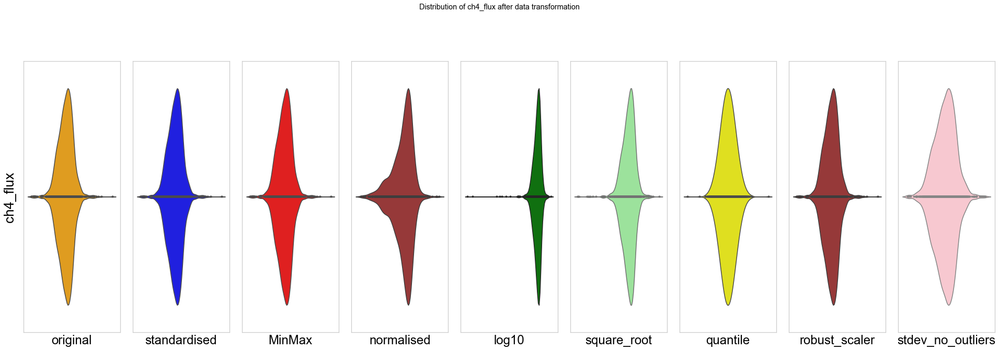

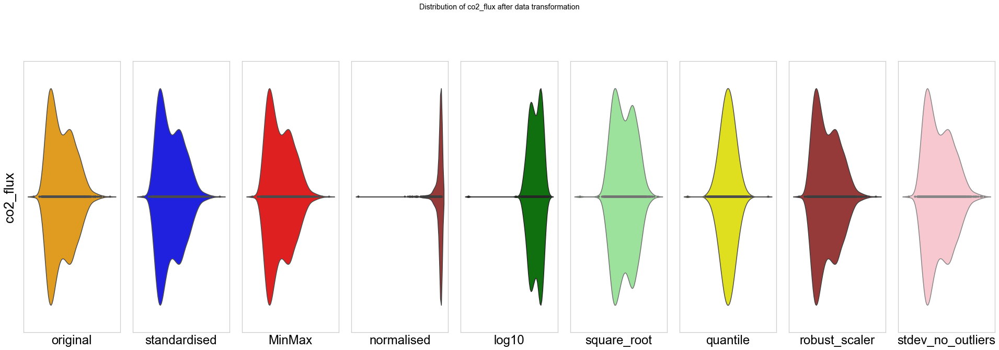

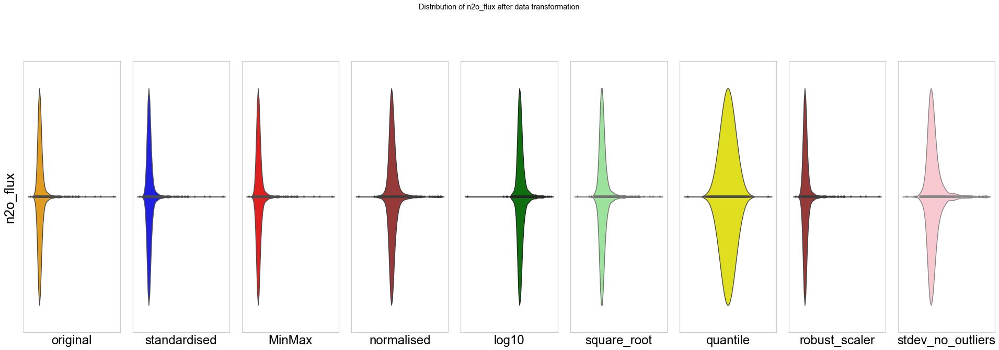

In [36]:
def compare_transformations_plot(dataframe, var_name, title, plot_name):
    """Display variables distribution after the various transformation methods.

    Check normality visually (qualitative approach).

    Args:
        dataframe (object): mixture of original and transformed variables.
        var_name (string): name of the dependent variable.
        title (string): name of the graph title.
        plot_name (string): name of the figure file saved (as .png file).

    Returns:
        object: figure of the eight violin plots created.
    """
    title = title
    plot_name = plot_name

    fig, ax = plt.subplots(figsize=(27, 9), sharex=False, sharey=True,)

    ax0 = plt.subplot(191)
    violin_plot = sns.violinplot(
        dataframe[var_name], orient="vertical", color="orange", inner="points"
    )
    ax0.tick_params(labelsize=24)
    ax0.set(xticklabels=[], xticks=[])
    violin_plot.set_xlabel(
        "original",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    violin_plot.set_ylabel(var_name, color="black", fontsize=26)
    violin_plot.set_yticklabels(
        violin_plot.get_yticklabels(), rotation=0, verticalalignment="center"
    )
    ax1 = plt.subplot(192)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_std"],
        orient="vertical",
        color="blue",
        inner="points",
    )
    ax1.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "standardised",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax2 = plt.subplot(193)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_MinMax"],
        orient="vertical",
        color="red",
        inner="points",
    )
    ax2.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "MinMax", fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax3 = plt.subplot(194)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_norm"],
        orient="vertical",
        color="brown",
        inner="points",
    )
    ax3.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "normalised",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax4 = plt.subplot(195)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_log10"],
        orient="vertical",
        color="green",
        inner="points",
    )
    ax4.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "log10", fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax5 = plt.subplot(196)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_sqrt"],
        orient="vertical",
        color="lightgreen",
        inner="points",
    )
    ax5.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "square_root",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax6 = plt.subplot(197)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_quant"],
        orient="vertical",
        color="yellow",
        inner="points",
    )
    ax6.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "quantile",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax7 = plt.subplot(198)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_robust"],
        orient="vertical",
        color="brown",
        inner="points",
    )
    ax7.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "robust_scaler",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    ax8 = plt.subplot(199)
    violin_plot = sns.violinplot(
        dataframe[var_name + "_stdev_no_outliers"],
        orient="vertical",
        color="pink",
        inner="points",
    )
    ax8.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    violin_plot.set_xlabel(
        "stdev_no_outliers",
        fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    )
    # ax9 = plt.subplot(199)
    # violin_plot = sns.violinplot(
    #     dataframe[var_name + "_iqr_no_outliers"],
    #     orient="vertical",
    #     color="violet",
    #     inner="points",
    # )
    # ax9.set(xticklabels=[], xticks=[], yticklabels=[], yticks=[])
    # violin_plot.set_xlabel(
    #     "iqr_no_outliers",
    #     fontdict={"fontsize": 24, "fontweight": 3, "color": "black"},
    # )
    plt.suptitle(
        title,
        y=1.05,
        fontdict={"fontsize": 38, "fontweight": 3, "color": "black"},
        horizontalalignment="center",
    )
    plt.tight_layout(pad=2)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return violin_plot


dep_vars_list = ("ch4_flux", "co2_flux", "n2o_flux")
for var_name in dep_vars_list:
    violin_plot = compare_transformations_plot(
        dep_vars_clean_original_transformed_no_outliers,
        var_name=var_name,
        title=f"Distribution of {var_name} after data transformation\n",
        plot_name=f"{var_name}_distrib_violinplots",
    )



In [37]:
def concatenate_original_best_transformed_dep_vars():
    """Concatenate the final dataset (including the best transformations).

    It also contains all original data, including categorical variables, and
    original data without outliers.

    Returns:
        object: dataframe with all aggregated dataframes from transformation.
    """
    summary_clean_original_best_transformed_dataframes = [
        dep_vars_clean,
        dep_vars_clean_original_transformed_no_outliers[
            "ch4_flux_stdev_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers[
            "ch4_flux_iqr_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers["ch4_flux_norm"],
        dep_vars_clean_original_transformed_no_outliers["ch4_flux_quant"],
        dep_vars_clean_original_transformed_no_outliers["ch4_flux_robust"],
        dep_vars_clean_original_transformed_no_outliers[
            "co2_flux_stdev_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers[
            "co2_flux_iqr_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers["co2_flux_sqrt"],
        dep_vars_clean_original_transformed_no_outliers["co2_flux_quant"],
        dep_vars_clean_original_transformed_no_outliers["co2_flux_robust"],
        dep_vars_clean_original_transformed_no_outliers[
            "n2o_flux_stdev_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers[
            "n2o_flux_iqr_no_outliers"
        ],
        dep_vars_clean_original_transformed_no_outliers["n2o_flux_log10"],
        dep_vars_clean_original_transformed_no_outliers["n2o_flux_quant"],
        dep_vars_clean_original_transformed_no_outliers["n2o_flux_robust"],
    ]
    dep_vers_clean_original_best_transformed_no_outliers = pd.concat(
        summary_clean_original_best_transformed_dataframes, sort=False, axis=1
    )
    print(f"\nFinal dataframe info: \n")
    print(f"\n{dep_vers_clean_original_best_transformed_no_outliers.info()}\n")
    print(
        f"\nFinal dataframe preview: \n"
        f"\n{dep_vers_clean_original_best_transformed_no_outliers.sample(10)}"
    )
    return (
        summary_clean_original_best_transformed_dataframes,
        dep_vers_clean_original_best_transformed_no_outliers,
    )


(
    summary_clean_original_best_transformed,
    dep_vers_clean_original_best_transformed_no_outliers,
) = concatenate_original_best_transformed_dep_vars()

# compare the effect of transformation on the distribution of the
# dependent variables
dep_vars_clean_original_best_transformed_no_outliers_eda = exploratory_data_analysis(
    dep_vers_clean_original_best_transformed_no_outliers,
    eda_summary="eda_summary_dep_vars_clean_original_best_transformed_no_outliers",
    file_name="dep_vars_clean_original_best_transformed_no_outliers_eda",
)




Final dataframe info: 

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 1596 entries, 4125 to 16098
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ch4_flux                    1536 non-null   float64
 1   co2_flux                    1530 non-null   float64
 2   n2o_flux                    1503 non-null   float64
 3   ch4_flux_stdev_no_outliers  1522 non-null   float64
 4   ch4_flux_iqr_no_outliers    1504 non-null   float64
 5   ch4_flux_norm               1502 non-null   float64
 6   ch4_flux_quant              1536 non-null   float64
 7   ch4_flux_robust             1536 non-null   float64
 8   co2_flux_stdev_no_outliers  1529 non-null   float64
 9   co2_flux_iqr_no_outliers    1498 non-null   float64
 10  co2_flux_sqrt               1530 non-null   float64
 11  co2_flux_quant              1530 non-null   float64
 12  co2_flux_robust             1530 non-null   float64
 13

In [38]:
def concatenate_final_variables():
    """Concatenate all variables back together.

    This applies to categorical, datetime and dependent/numerical variables.
    """
    ghg_flux_dataframes = [
        cat_vars_clean,
        datetime_vars_clean,
        dep_vers_clean_original_best_transformed_no_outliers,
    ]
    ghg_flux_data_clean_transformed_no_outliers = pd.concat(
        ghg_flux_dataframes, sort=False, axis=1
    )
    print(f"Final dataset following data transformation: \n")
    print(f"\n{ghg_flux_data_clean_transformed_no_outliers.info()}\n")
    print(
        f"\nDataset preview: \n"
        f"\n{ghg_flux_data_clean_transformed_no_outliers.sample(10)}\n"
        f"\nDataset summary : \n"
        f"{ghg_flux_data_clean_transformed_no_outliers.describe(include='all')}\n"
    )
    return ghg_flux_data_clean_transformed_no_outliers


ghg_flux_data_clean_transformed_no_outliers = concatenate_final_variables()

ghg_flux_data_clean_transformed_no_outliers_eda = exploratory_data_analysis(
    ghg_flux_data_clean_transformed_no_outliers,
    eda_summary="eda_summary_ghg_flux_data_clean_transformed_no_outliers",
    file_name="ghg_flux_data_clean_transformed_no_outliers_eda",
)



Final dataset following data transformation: 

<class 'pandas.core.frame.DataFrame'>
CategoricalIndex: 1596 entries, 4125 to 16098
Data columns (total 28 columns):
 #   Column                      Non-Null Count  Dtype                           
---  ------                      --------------  -----                           
 0   Sampling_Date               1596 non-null   category                        
 1   Year                        1596 non-null   category                        
 2   Month                       1596 non-null   category                        
 3   Season                      1596 non-null   category                        
 4   Operator                    1540 non-null   category                        
 5   co2_treatment               1596 non-null   category                        
 6   Ring                        1596 non-null   category                        
 7   Block                       1596 non-null   category                        
 8   Collar_Uniq

In [39]:
# NOT working anymore ?!
def create_pivot_table_heatmap(
    dataframe,
    var_name,
    index_1,
    columns_1,
    title_1,
    index_2,
    columns_2,
    title_2,
    plot_name,
):
    """Visualise effect of transformation on categorical & dependent variables.

    A pivot table is created to contrast the change ghg flux emissions against
    experimental treatments, as defined by the categorical variables.

    Args:
        dataframe (object): dataframe to be analysed.
        var_name (string): name of the variable being investigated.
        index_1 (string): first categorical variable for separating the
            treatment type (i.e. aCO2 vs. eCO2).
        columns_1 (string): first categorical variable for class analysis
            (i.e. years of analyses).
        title_1 (string): name of the first graph title.
        index_2 (string): second categorical variable for separating the
            treatment type (i.e. aCO2 vs. eCO2).
        columns_2 (string): first categorical variable for class analysis
            (i.e. ring number).
        title_2 (string): name of the second graph title.
        plot_name (string): name of the figure file saved (as .png file).

    Returns:
        tuple: two dataframes with pivot table output; two figures.
    """
    plot_name = plot_name

    fig, ax = plt.subplots(figsize=(16, 8))
    plt.subplot2grid((1, 2), (0, 0), colspan=1)
    pivot_1 = pd.pivot_table(
        dataframe, index=index_1, columns=columns_1, values=var_name,
    )
    heatmap_1 = sns.heatmap(
        pivot_1, annot=True, annot_kws={"size": 14}, center=0, fmt=".1f",
    )
    cbar = heatmap_1.collections[0].colorbar
    cbar.ax.tick_params(labelsize=15)
    heatmap_1.set_xlabel(columns_1, fontsize=18)
    heatmap_1.set_ylabel(index_1, fontsize=18)
    heatmap_1.set_title(title_1, fontdict={"fontsize": 20}, pad=6)
    plt.xticks(rotation=0, horizontalalignment="center", fontsize=16)
    plt.yticks(rotation=90, verticalalignment="center", fontsize=16)

    plt.subplot2grid((1, 2), (0, 1), colspan=1)
    pivot_2 = pd.pivot_table(
        dataframe, index=index_2, columns=columns_2, values=var_name,
    )
    heatmap_2 = sns.heatmap(
        pivot_2, annot=True, annot_kws={"size": 14}, center=0, fmt=".1f",
    )
    cbar = heatmap_2.collections[0].colorbar
    cbar.ax.tick_params(labelsize=15)
    heatmap_2.set_xlabel(columns_2, fontsize=18)
    heatmap_2.set_ylabel(index_2, fontsize=18)
    heatmap_2.set_title(title_2, fontdict={"fontsize": 20}, pad=6)
    plt.xticks(rotation=0, horizontalalignment="center", fontsize=18)
    plt.yticks(rotation=90, verticalalignment="center", fontsize=18)

    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    print()  # leave a space between graphs
    return pivot_1, heatmap_1, pivot_2, heatmap_2


# for var_name in dep_vars_list:
#     create_pivot_table_heatmap(
#         dep_vars_clean_best_transformed_no_outliers,
#         var_name,
#         index_1="co2_treatment",
#         columns_1="Year",
#         title_1=f"{var_name} overall Year\n",
#         index_2="co2_treatment",
#         columns_2="Ring",
#         title_2=f"{var_name} overall Ring\n",
#         plot_name=f"{var_name}_data_clean_pivot_plot",
#     )



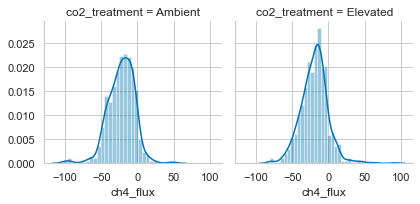

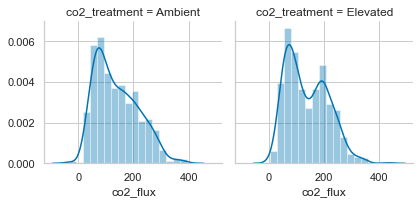

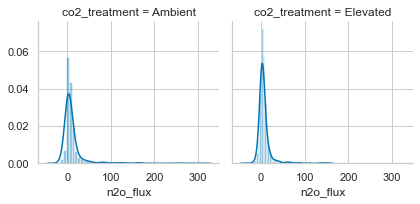

In [40]:
# # create pivot tables as above but compare values between raw and transformed
# transf_vars_list = ("n2o_flux", "n2o_flux_iqr_no_outliers")
# for transf_var_name in transf_vars_list:
#     create_pivot_table_heatmap(
#         dep_vars_clean_best_transformed_no_outliers,
#         transf_var_name,
#         index_1="co2_treatment",
#         columns_1="Year",
#         title_1=f"{transf_var_name} overall Year\n",
#         index_2="co2_treatment",
#         columns_2="Ring",
#         title_2=f"{transf_var_name} overall Ring\n",
#         plot_name=f"{transf_var_name}_data_clean_pivot_plot",
#     )


def facet_grid(
    dataframe, treatment, values, title, plot_name, hue=None,
):
    """Produce a FacetGrid object.

    For visualising dataset variable's distribution under each treatment factor

    Args:
        dataframe (object): dataframe being investigated.
        treatment (string): treatment factor i.e. aCO2 vs. eCO2.
        values (string): variable's name.
        title (string): name of the graph title.
        plot_name (string): name of figure file saved (as .png file).
        hue (string, optional): Option to choose a separating factor,
            such as "Season". Defaults to None.

    Returns:
        object: figure of distribution plot.
    """
    title = title
    plot_name = plot_name

    facet_grid = sns.FacetGrid(dataframe, col=treatment, hue=hue)
    facet_grid.map(sns.distplot, values)
    plt.savefig(
        file_path_figure + plot_name + ".png", dpi=100, bbox_inches="tight"
    )
    plt.show()
    return facet_grid


for var_name in dep_vars_list:
    facet_grid(
        dep_vars_clean_w_season_co2_treatment,
        treatment="co2_treatment",
        values=var_name,
        title=f"Distribution of {var_name} across CO2 treatment\n",
        plot_name=f"{var_name}_distrib_co2_treatment",
    )



In [41]:
def save_backup_files(dataframe, file_name):
    """Create a back-up of the newly generated files,both .csv & .pickle files.

    For pickling, protocol value ranges from 0 to 5 (the higher, the better).

    This is applied when a new .csv file is created in
    the "./save" folder and will be used as a source by another function.
    Hence, a copy of the new file is made and named with the "_backup" suffix
    and the initial file is then copied to the ".sources" folder.
    It will become a source file for the exploratory data analysis (EDA).

    Args:
        dataframe (object): final dataframe from the concatenation of the
            original variables and their best transform.
        file_name (string): name given to the .csv and .pkl files.

    Returns:
        tuple: two files with extension ".csv" and ".pkl".
    """
    csv = dataframe.to_csv(
        file_path_save + file_name + ".csv",
        sep=",",
        encoding="utf-8",
        na_rep="nan",
        header=True,
        index=True,
    )
    pickle = dataframe.to_pickle(
        file_path_save + file_name + ".pkl", compression="infer", protocol=5
    )
    save_file_format = [".pkl", ".csv"]  # must be in this order,or not working
    for file_format in save_file_format:
        original = file_path_save + file_name + file_format
        target_0 = file_path_backup + file_name + "_backup" + file_format
        shutil.copyfile(original, target_0)

        target_1 = file_path_source + file_name + file_format
        shutil.copyfile(original, target_1)
        print(f"\nFiles saved and backed-up!\n")
        return csv, pickle


save_backup_files(
    ghg_flux_data_clean_transformed_no_outliers,
    file_name="ghg_flux_data_clean_transformed_no_outliers",
)



Files saved and backed-up!



(None, None)